## 1. 필요한 라이브러리들을 불러온다.

In [1]:
# python 제공 라이브러리
import os
import numpy as np 
import matplotlib.pyplot as plt

In [2]:
# 인공지능 모델링에 사용되는 tensorflow 라이브러리
from tensorflow.keras.layers import Input, Conv2D, Flatten, Dense
from tensorflow.keras.layers import BatchNormalization, ReLU, MaxPooling2D
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import ModelCheckpoint

In [3]:
# 자체적으로 제작된 모듈
from datagenerator import TightFaceProvider
from helper import glob_all_files, paths2numpy, cropper, show_images, draw_rectangles

## 2. 이후 작업에 GPU 를 사용하도록 설정한다.

In [4]:
# GPU 를 사용하도록 설정
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="0"

## 3. 학습용, 검증용 데이터를 불러온 후 인공지능 모델 학습에 알맞게 가공해준다.

In [6]:
# 최상위 데이터 폴더명을 저장
data_root_folder = 'sample_data3'

# 학습용 이미지들의 경로를 불러옵니다.
fg_folder = f"../data/{data_root_folder}/train/wally"
bg_folder = f"../data/{data_root_folder}/train/backgrounds"

val_fg_folder = f"../data/{data_root_folder}/val/wally"
val_bg_folder = f"../data/{data_root_folder}/val/backgrounds"

tfp = TightFaceProvider(fg_folder, bg_folder, val_fg_folder, val_bg_folder,batch_size=64)

Max Height : 56 	 Min Height : 29
Max Width : 45 	 Min Width : 20
Max W/H Ratio : 0.8035714285714286 	 Min Ratio : 0.4423076923076923


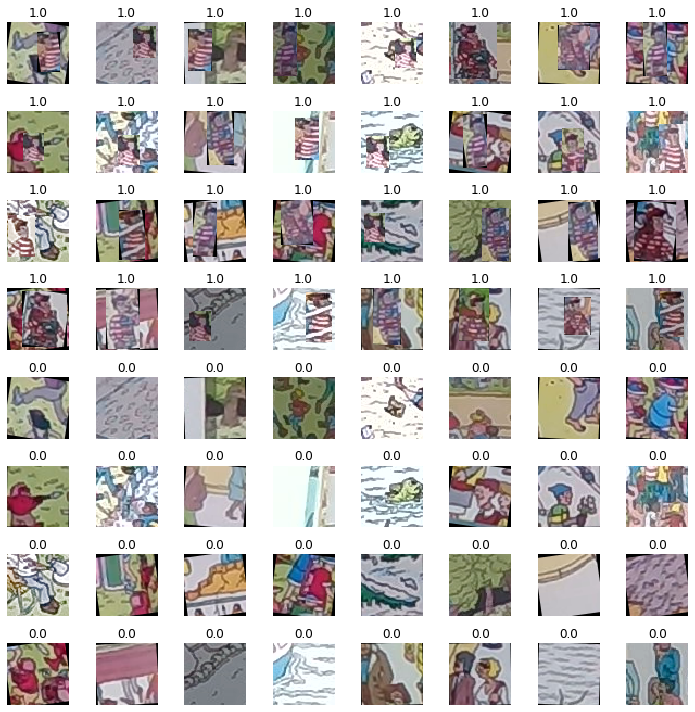

In [7]:
show_images(tfp[0][0], titles=list(tfp[0][1]))

## 4. 학습 모델을 구축한다.

In [8]:
# CNN 딥러닝 모델 구조 설정

# 입력층
inputs = Input(shape=(tfp.max_length+1, tfp.max_length+1, 3), name='inputs')

# 은닉층
# Convolutional Layer 1
conv = Conv2D(filters=32, kernel_size=3, padding='same', kernel_initializer='he_normal')(inputs)
norm = BatchNormalization()(conv)
relu = ReLU()(norm)
pool = MaxPooling2D()(relu)

# Convolutional Layer 2
conv = Conv2D(filters=64, kernel_size=3, padding='same', kernel_initializer='he_normal')(pool)
norm = BatchNormalization()(conv)
relu = ReLU()(norm)
pool = MaxPooling2D()(relu)

# Convolutional Layer 3
conv = Conv2D(filters=128, kernel_size=3, padding='same', kernel_initializer='he_normal')(pool)
norm = BatchNormalization()(conv)
relu = ReLU()(norm)
pool = MaxPooling2D()(relu)

flat = Flatten()(pool)

# Fully Connected Layer 1
fcn1 = Dense(units=256, kernel_initializer='he_normal')(flat)
norm = BatchNormalization()(fcn1)
relu = ReLU()(norm)

# Fully Connected Layer 2
fcn2 = Dense(units=256, kernel_initializer='he_normal')(relu)
norm = BatchNormalization()(fcn2)
relu = ReLU()(norm)

# 출력층
pred = Dense(units=1, activation='sigmoid')(relu)

# 모델 컴파일
model = Model(inputs, pred)
model.compile('adam', 'binary_crossentropy', metrics=['accuracy'])

In [9]:
# 완성된 모델을 저장할 경로 지정
model_name = "ch-ai-kit_model_12_27"
model_dir = f"../models/{model_name}"

# 위의 경로가 존재하지 않을 시, 새로 생성
os.makedirs(model_dir, exist_ok=True)

weight_path= f"../models/{model_name}/{model_name}"

In [10]:
# 학습 도중 loss 가 가장 적게 나온 모델을 저장하기 위한 callback 설정
model_checkpoint_callback = ModelCheckpoint(
    filepath=weight_path,
    save_weights_only=True,
    monitor='val_loss',
    mode='min',
    save_best_only=True)

## 5. 모델을 학습시키고, 제일 loss 가 적게 나온 모델을 저장한다.

In [11]:
# 모델 학습
history = model.fit(tfp, validation_data=(tfp.get_validation_set()), epochs=5, callbacks=[model_checkpoint_callback])

# 모델 학습에 사용한 이미지 길이, 스트라이드 설정을 저장
f = open(f"{weight_path}.txt", 'w')
f.write(f"{tfp.max_length+1}\n")
f.write(f"{tfp.stride}")
f.close()

  ...
    to  
  ['...']
Train for 4307 steps, validate on 59496 samples
Epoch 1/5
4307/4307 [==============================] - 145s 34ms/step - loss: 0.0130 - accuracy: 0.9952 - val_loss: 0.0663 - val_accuracy: 0.9805
Epoch 2/5
4307/4307 [==============================] - 141s 33ms/step - loss: 0.0018 - accuracy: 0.9994 - val_loss: 0.0967 - val_accuracy: 0.9762
Epoch 3/5
4307/4307 [==============================] - 139s 32ms/step - loss: 0.0010 - accuracy: 0.9997 - val_loss: 0.1498 - val_accuracy: 0.9564
Epoch 4/5
4307/4307 [==============================] - 140s 32ms/step - loss: 6.5536e-04 - accuracy: 0.9998 - val_loss: 0.2499 - val_accuracy: 0.9492
Epoch 5/5
4307/4307 [==============================] - 142s 33ms/step - loss: 5.5264e-04 - accuracy: 0.9998 - val_loss: 0.0981 - val_accuracy: 0.9761


## 6. 학습 동안의 loss 변화를 시각화한다.

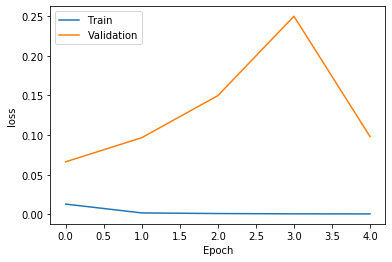

In [12]:
# 모델 학습 동안의 loss 변화 시각화
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('Epoch')
plt.ylabel('loss')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

## 7. 진행한 학습 중 제일 loss 가 적게 나온 모델을 불러온다.

In [13]:
# val_loss 가 가장 적게 나온 가중치 불러오기
model.load_weights(weight_path)

In [14]:
# 가장 loss 가 적게 나온 모델을 저장
model.save(model_dir)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: ../models/ch-ai-kit_model_12_27/assets


## 8. 모델을 평가용 데이터로 테스트한다.

In [15]:
# 평가용 데이터가 들어있는 폴더 경로 가져오기
test_folder = f"../data/{data_root_folder}/test"

In [16]:
# 모델에서 사용한 이미지 길이 및 스트라이드 설정 가져오기
f = open(f"{weight_path}.txt", 'r')
length = int(f.readline())
stride = int(f.readline())
f.close()

예측값: [0.70182264]


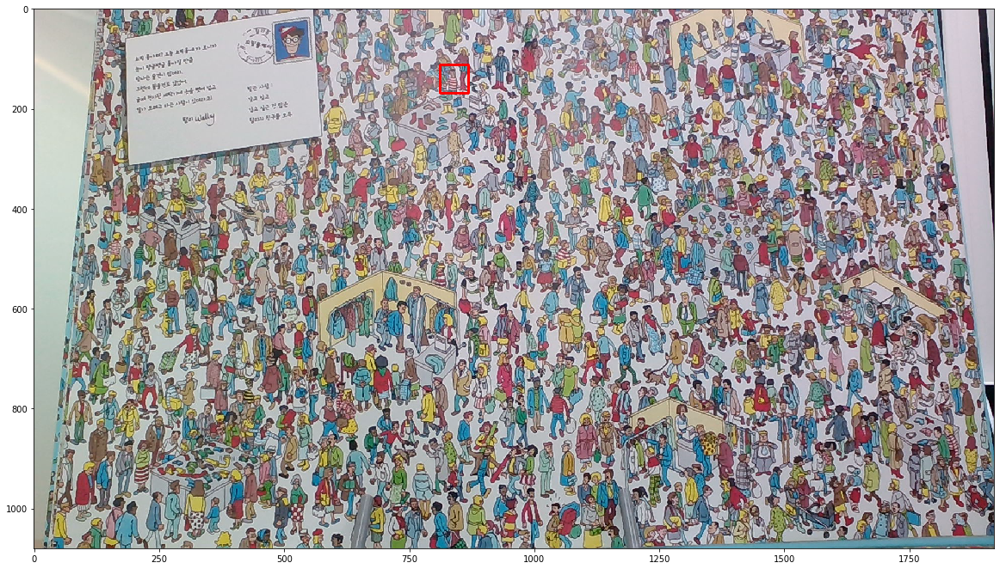

예측값: [0.99962306]


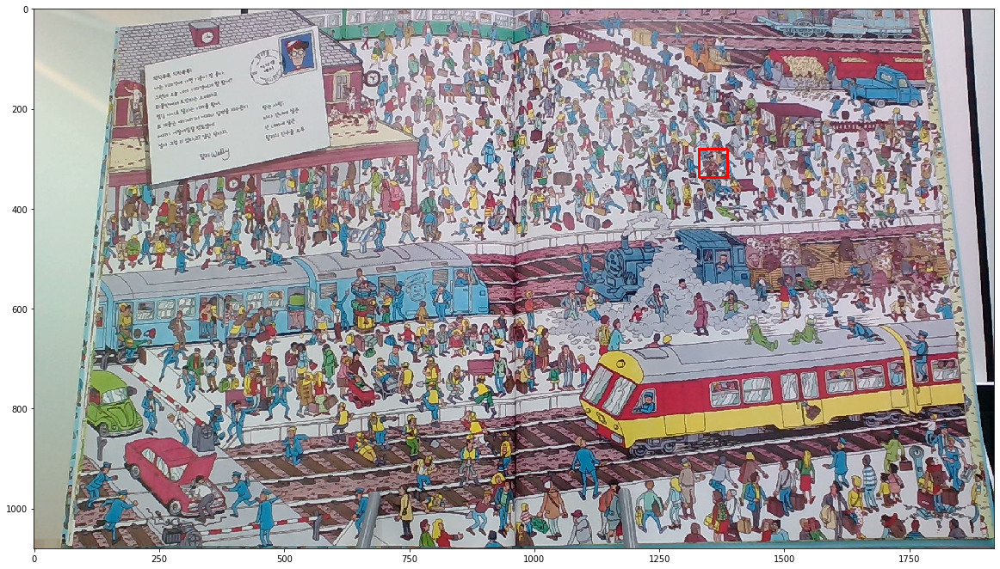

예측값: [0.9194199]


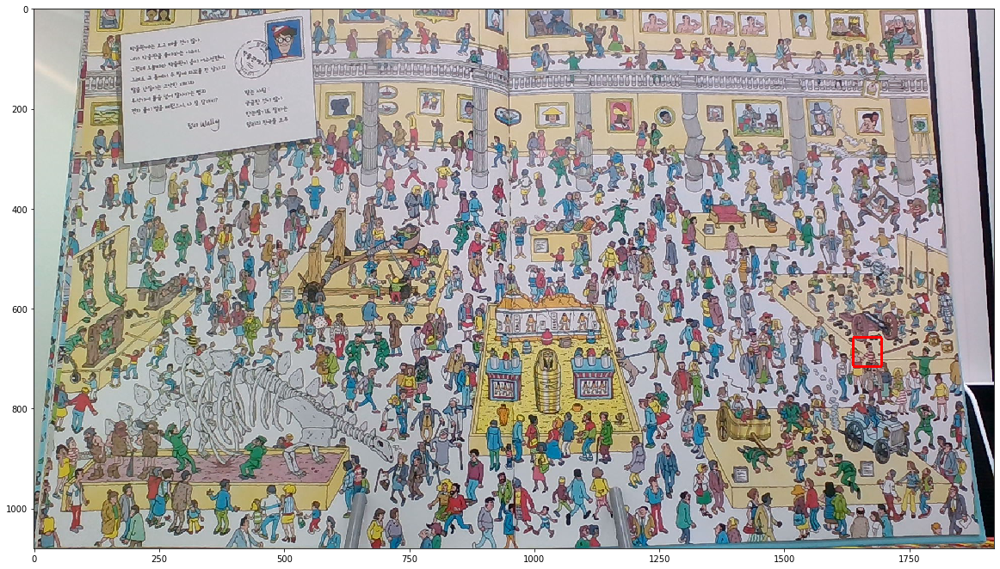

예측값: [0.00100236]


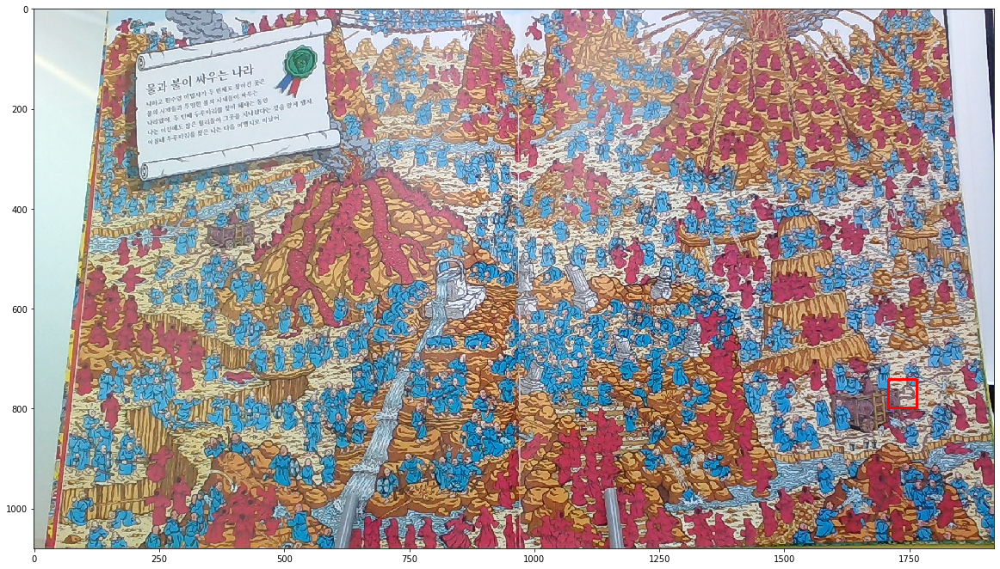

In [17]:
# case 1: 월리가 있을 확률이 제일 높은 곳에만 빨간 사각형을 그린다.
images = sorted(glob_all_files(test_folder))
images = paths2numpy(images)

for i, image in enumerate(images):

    cropped_imgs, cropped_crds = cropper(image, stride, stride, length, length)

    # 예측값을 저장한 후, 그 중 가장 높은 예측 값이 나온 부분에 대한 불리언 마스크를 만드는 부분입니다.
    predicts = model.predict(cropped_imgs)
    bool_mask = np.where(predicts[:, 0] == np.max(predicts[:, 0]))
    

#     show_images(cropped_imgs[bool_mask])    # 불리언 마스크를 적용시킨 결과로 얻은 월리의 얼굴로 추정되는 이미지 조각들을 출력
    target_crds = np.array(cropped_crds)[bool_mask]     # 월리의 얼굴이 있을 것으로 예상되는 좌표들을 저장

    predicts = predicts[bool_mask]  # 불리언 마스크를 적용시켰을 때의 예측값을 저장
    print(f"예측값: {predicts[0]}")
    result_image = draw_rectangles(image, target_crds, (255, 0, 0), 3, predicts[:, 0])

    plt.figure().set_size_inches(20,20)
    plt.imshow(result_image)
    plt.show()

[[0.70182264]
 [0.5431621 ]]


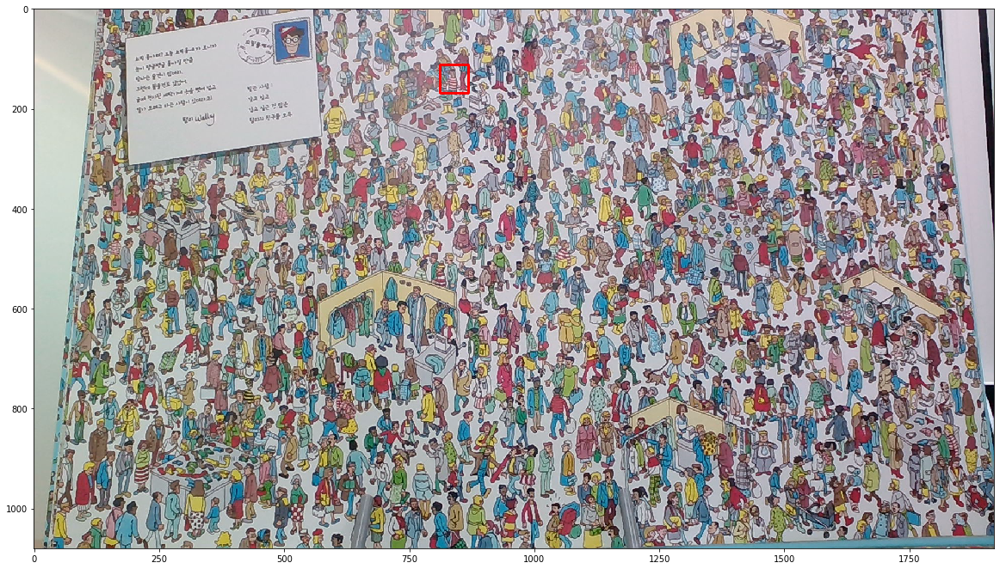

[[0.9690452 ]
 [0.99599695]
 [0.99962306]
 [0.9959745 ]
 [0.8371474 ]
 [0.9975712 ]
 [0.9777207 ]
 [0.82937974]]


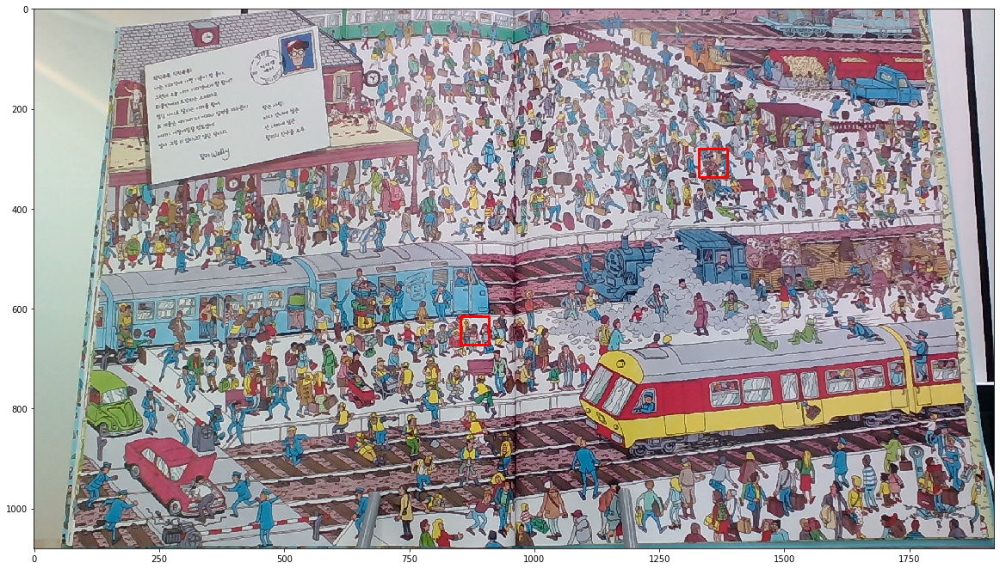

[[0.9194199 ]
 [0.52847207]]


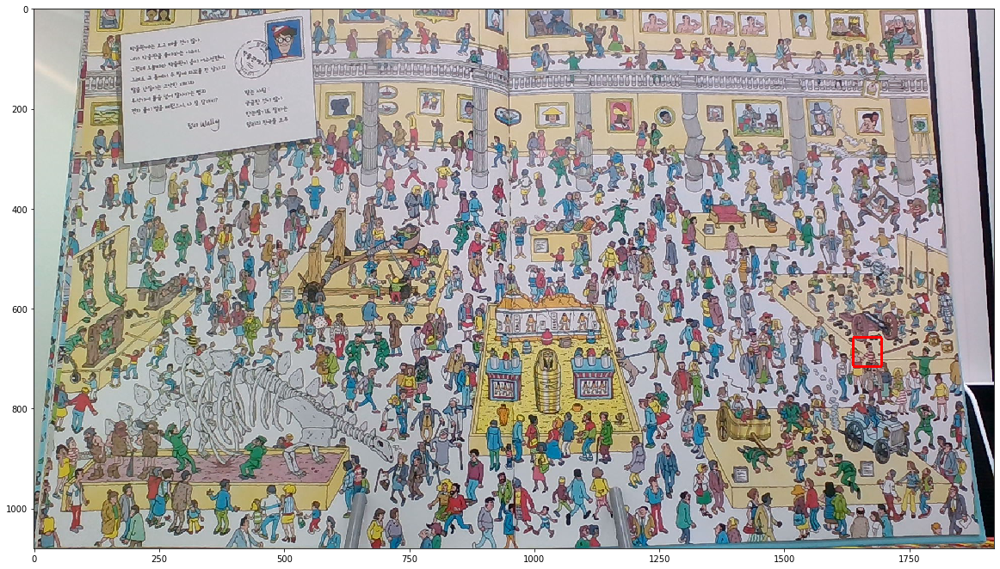

[]


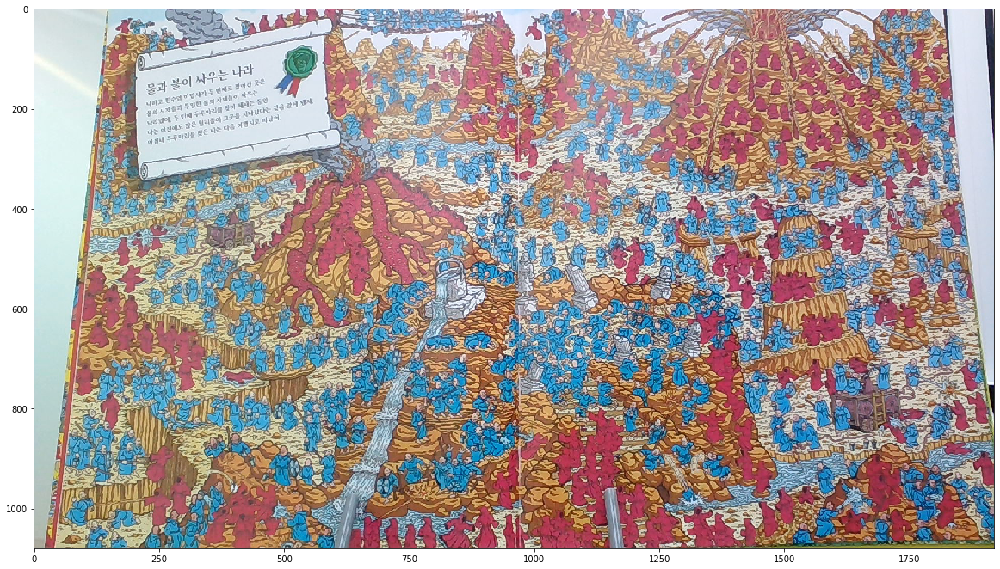

In [18]:
# case 2: 월리가 있을 확률이 0.5 이상인 곳들에 빨간 사각형을 그린다.
images = sorted(glob_all_files(test_folder))
images = paths2numpy(images)

for i, image in enumerate(images):

    cropped_imgs, cropped_crds = cropper(image, stride, stride, length, length)

    # 예측값을 저장한 후, 그 중 0.5가 넘는 값들에 대한 불리언 마스크를 만드는 부분입니다.
    predicts = model.predict(cropped_imgs)
    bool_mask = (predicts > 0.5)[:,0]
    

#     show_images(cropped_imgs[bool_mask])    # 불리언 마스크를 적용시킨 결과로 얻은 월리의 얼굴로 추정되는 이미지 조각들을 출력
    target_crds = np.array(cropped_crds)[bool_mask]     # 월리의 얼굴이 있을 것으로 예상되는 좌표들을 저장

    predicts = predicts[bool_mask]  # 불리언 마스크를 적용시켰을 때의 예측값을 저장
    print(predicts)
    result_image = draw_rectangles(image, target_crds, (255, 0, 0), 3, predicts[:, 0])

    plt.figure().set_size_inches(20,20)
    plt.imshow(result_image)
    plt.show()